<footer id="attribution" style="float:right; color:#999">
Created by Thibault Dody, 05/07/2020.
</footer>

<figure>
<img src="../app/static/oil-paint-banner.jpg" style="width:1920px;">
</figure>

# Exploratory Data Analysis

## Table of Content

1. Import Modules and Libraries
2. Import Dataset
3. Data Statistics
4. Data Cleaning
5. Data Exploration

## Import Modules and Libraries

In [1]:
import os, sys
sys.path.append('..')

import PIL
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("darkgrid")
sns.set(font_scale = 1.5)

import StyleYourArt
from StyleYourArt.dataloader import *
from StyleYourArt.tools import *

Using TensorFlow backend.


## Import Dataset

In [2]:
## Locations
DATA_DIR = '../data/csv/'
IMAGE_DIR = '../data/images/'

In [3]:
## extract data from csv file
df = load_data(DATA_DIR, IMAGE_DIR, verbose=True)

... loading painting data from master.csv
... painting data imported from master.csv
... setting dataframe schema
... exporting unique styles to styles.csv
... data loaded


## Data statistics

In [4]:
## print dataset info
print(print_data_info(df))

******************* SUMMARY *******************

Content
-----------------------------------------------
Rows: 169,677
Cols: 14
Number of artists: 3,350
Number of unique styles: 1,256
Date range: from -3050 to 2020


Info
-----------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 169677 entries, 0 to 19
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   artist_name      169677 non-null  object 
 1   artist_url       169677 non-null  object 
 2   completion_year  129803 non-null  float64
 3   content_id       169677 non-null  int64  
 4   height           169677 non-null  int64  
 5   image            169677 non-null  object 
 6   json_file        169677 non-null  object 
 7   style            158941 non-null  object 
 8   title            169677 non-null  object 
 9   url              169677 non-null  object 
 10  width            169677 non-null  int64  
 11  format 

As shown above, not all the paintings are assigned a style. The painting without style are removed.

In [5]:
## remove record without style
print("Record count before filtering record without style: {:,}".format(df.shape[0]))
df = df.dropna(subset=['style'])
print("Record count after filtering record without style: {:,}".format(df.shape[0]))

Record count before filtering record without style: 169,677
Record count after filtering record without style: 158,941


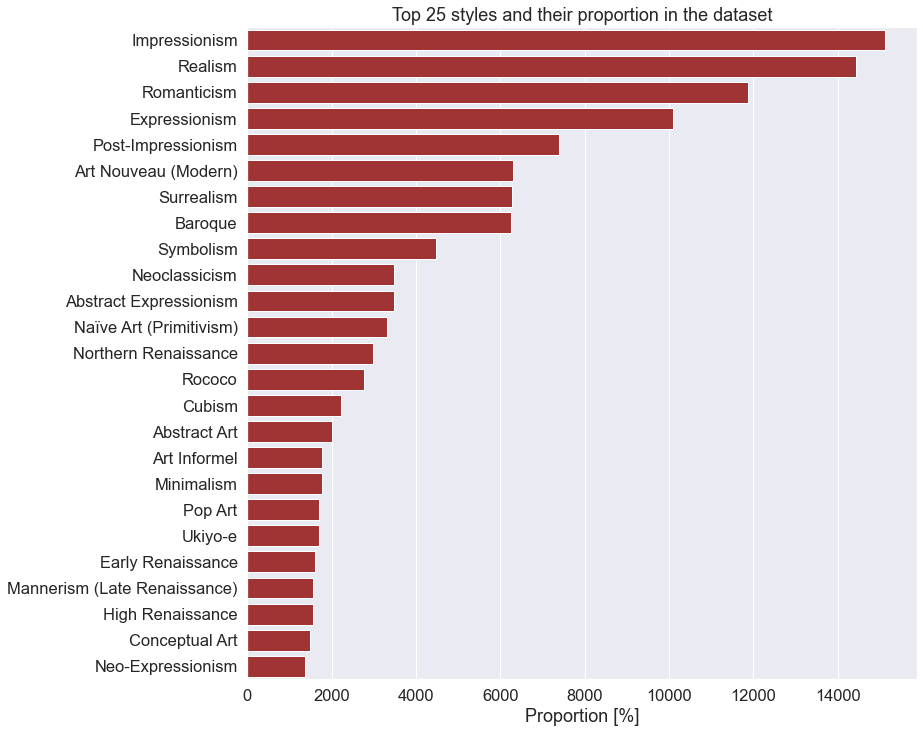

In [6]:
## list most common styles
top_25_styles = df['style'].value_counts().head(25)

## plot results
%matplotlib inline
fix, ax = plt.subplots(figsize=(12,12))
sns.barplot(y=top_25_styles.index, x=top_25_styles.values, color='firebrick')
ax.set_title("Top 25 styles and their proportion in the dataset")
ax.set_xlabel("Proportion [%]")
plt.show();

In [7]:
## display fraction over covered dataset
print("The most common 25 styles out of {} represents {:.2f}% of the dataset.".format(df['style'].nunique(),top_25_styles.sum()))

The most common 25 styles out of 1256 represents 117050.00% of the dataset.


In [8]:
## save top 25 styles
top_25_styles.to_csv('../data/csv/target.csv')

In [9]:
## store most common styles
top_25_styles = top_25_styles.index.to_list()

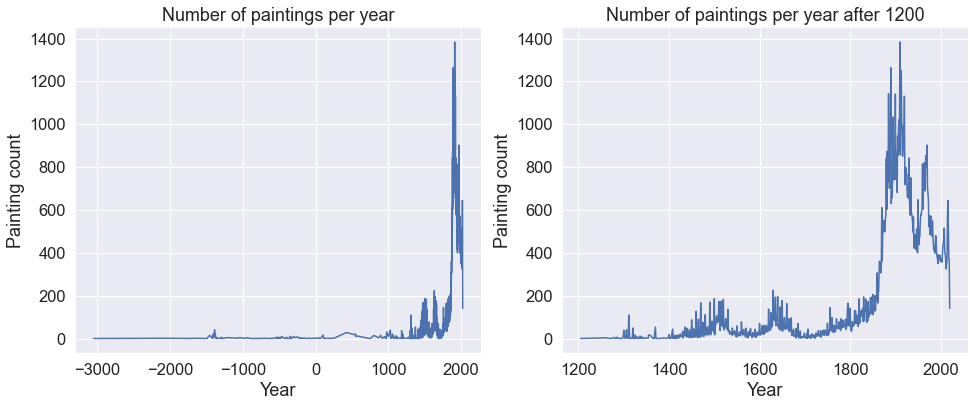

In [10]:
## display the painting distribution over time
fig, axes = plt.subplots(1,2,figsize=(16,6))
axes[0].plot(df.groupby(['completion_year'])['json_file'].count())
axes[0].set_title("Number of paintings per year")
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Painting count")
axes[1].plot(df[df['completion_year']>1200].groupby(['completion_year'])['json_file'].count())
axes[1].set_title("Number of paintings per year after 1200")
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Painting count")
plt.show();

**Note**:  
From the two above plots, it can be seen that the dataset contains only a few paintings dated from before 1000. It can also be seen that the number of paintings peaked in the early 1900 and has been slowly declining. This trend can be explained by either a decline in the number of artists or a lag as it takes time for artists to be recognized as such.

## Data Cleaning

Before we can work with the data, we need to remove some of the missing values.

In [11]:
## Rename missing artist names
df['artist_name'] = df['artist_name'].str.replace("￿", "UNKNOWN")

In [12]:
## filter dataset using selected 25 styles
print("Record count before filtering: {}".format(df.shape[0]))
df = df[df['style'].isin(top_25_styles)]
print("Record count after filtering: {}".format(df.shape[0]))

Record count before filtering: 158941
Record count after filtering: 117050


## Data Exploration

### Most Prolific Artists

In [13]:
## find most prolific artists
top_25_artists = df.groupby(['artist_name'])['content_id'].count().sort_values(ascending=False).head(26)
top_25_artists = top_25_artists.drop('UNKNOWN')
top_25_artists = top_25_artists.index.to_list()

## filter artists
artists = df.groupby(['artist_name','style'])['content_id'].count().sort_values(ascending=False)
artists = artists.reset_index()
artists = artists[artists['artist_name'].isin(top_25_artists)]
artists = artists.pivot_table(index='artist_name', columns='style', values='content_id').fillna(0)
artists = artists.loc[top_25_artists,:]

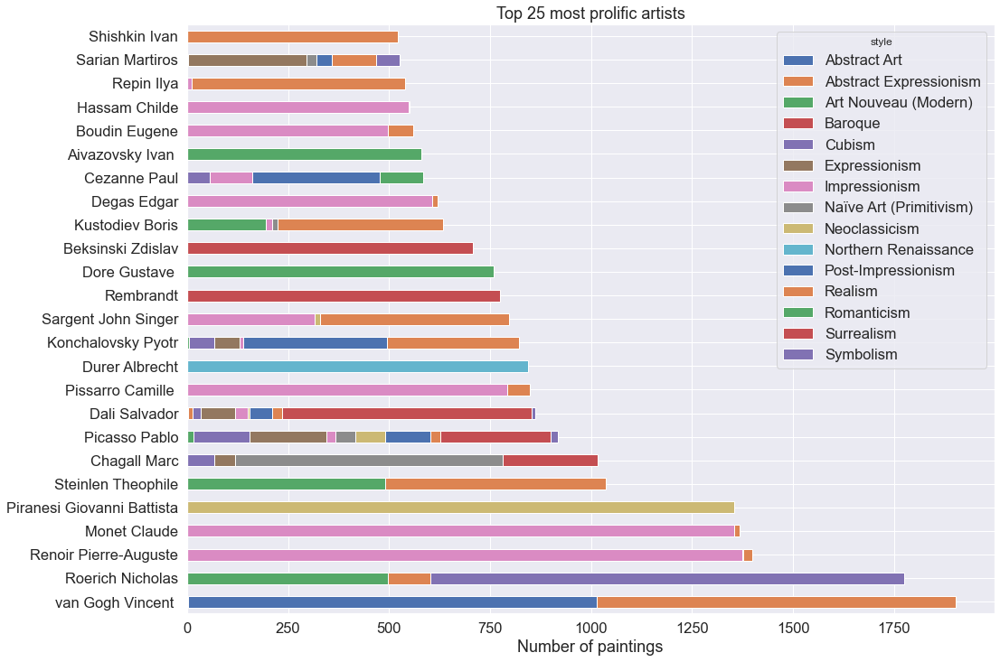

In [14]:
## plot results
fig, ax = plt.subplots(figsize=(16,12))
artists.plot(kind='barh', stacked=True, ax=ax)
ax.set_title("Top 25 most prolific artists")
ax.set_xlabel("Number of paintings")
ax.set_ylabel("")
plt.show();

**Note**:  
It is interesting to notice two types of artists. The first type consists of artists focusing on a single style. For instance Claude Monet who focused on Impressionism. While the second group consists of artists who explored various styles. We can for instance name Pablo Picasso and his work covering no less than ten styles.

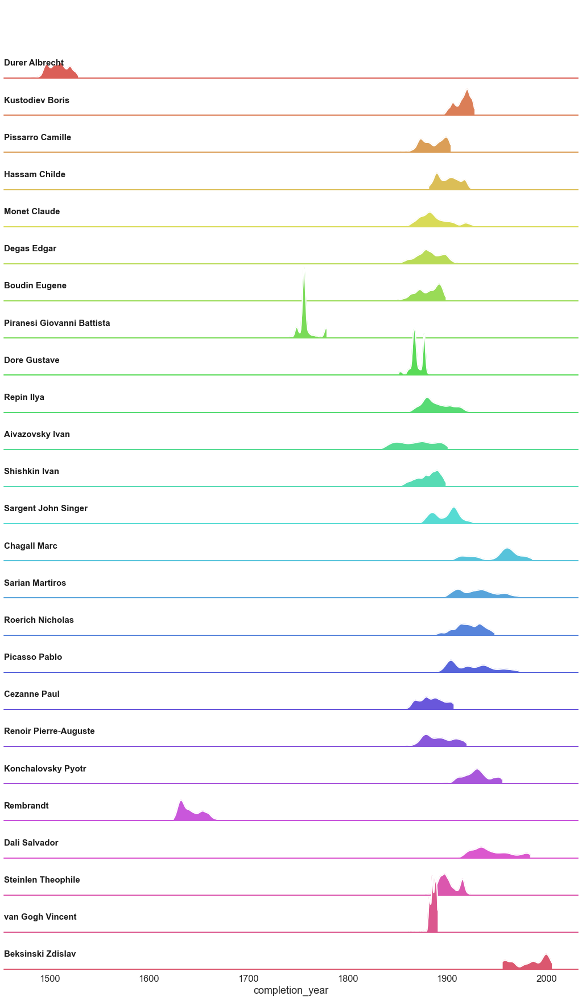

In [15]:
## plot period of activity of the most prolific artists
plot_over_time(df[df['artist_name'].isin(top_25_artists)], 'completion_year', 'artist_name')
plt.show()

### Image Shape

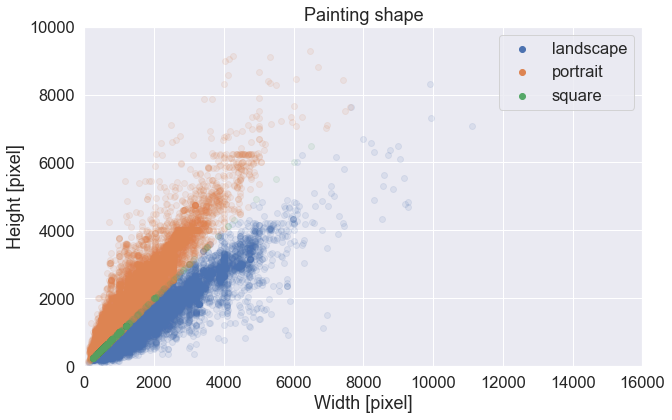

In [16]:
## plot image shape distribution
sns.set_style("darkgrid")
sns.set(font_scale = 1.5)
fig, ax = plt.subplots(figsize=(10,10*10/16))

## plot landscapes, squares, and portraits
ax.scatter(df[df['width']>df['height']]['width'], df[df['width']>df['height']]['height'], alpha=0.1, label='landscape')
ax.scatter(df[df['width']<df['height']]['width'], df[df['width']<df['height']]['height'], alpha=0.1, label='portrait')
ax.scatter(df[df['width']==df['height']]['width'], df[df['width']==df['height']]['height'], alpha=0.1, label='square')
ax.set_title("Painting shape")
ax.set_xlabel("Width [pixel]")
ax.set_ylabel("Height [pixel]")
leg = ax.legend(loc='best')
for lh in leg.legendHandles: 
    lh.set_alpha(1)
ax.set_xlim(0,16000)
ax.set_ylim(0,10000)
plt.show();

**Note**:  
The paintings can be divided into three categories, portrait (height>width), landscape (height<width), and square (height=width). It is interesting to notice that the dataset is almost symmetrical with respect to the x=y line.

### Styles Trends

Art styles are anchored in a specific period of time during which they were popular. In order to identify the lifespan of an art style, we can display the number of paintings created per year and per style.

In [17]:
df_order = df[['completion_year', 'style']]
df_order = pd.DataFrame(df_order.groupby('style').quantile(0.02)['completion_year'].sort_values()).reset_index()
df_order = pd.merge(df[['completion_year', 'style']], df_order, on="style")
df_order = df_order.sort_values(by='completion_year_y')
df_order = df_order.rename(columns={"completion_year_x": "Year"})

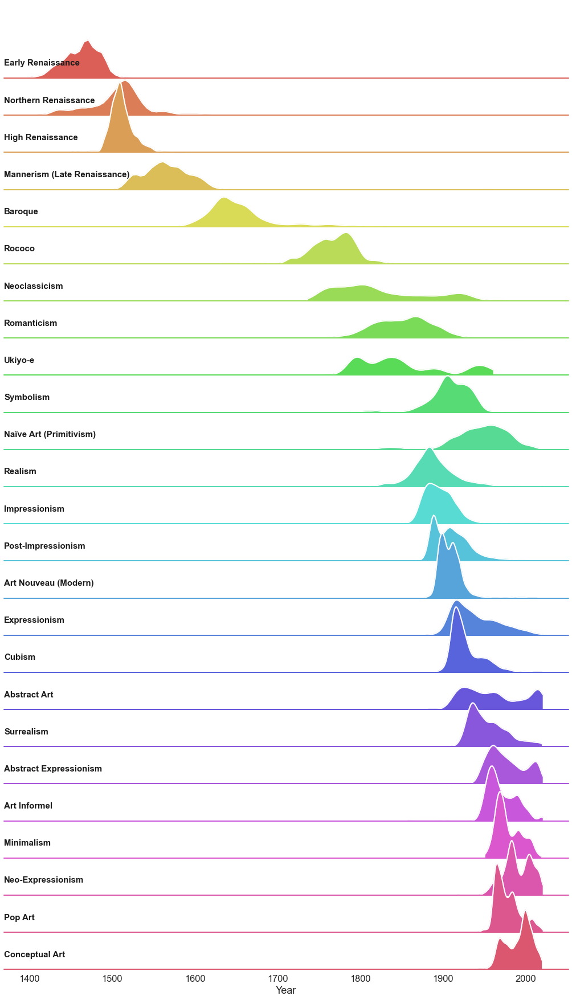

In [18]:
## plot style distribution over time
plot_over_time(df_order, 'Year', 'style', save=True)
plt.show()

**Note**:  
As expected, the completion date of an artwork is an important factor when trying to determine the art style. Unfortunately, our model is intended to make predictions using only an uploaded image. Therefore, the completion date remains unknown.

### Image Display

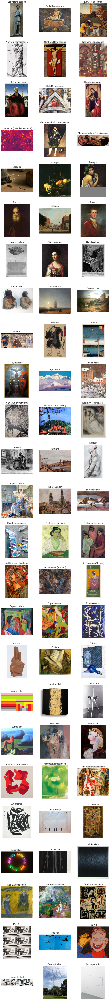

In [19]:
display_images(df, list(df_order['style'].unique()))
plt.show()